In [1]:
import tensorflow as tf
from utils import bbox_utils, data_utils, drawing_utils, io_utils, train_utils, eval_utils
from models.decoder import get_decoder_model
from helper import label_generator
from models.ssd_mobilenet_v2 import get_model, init_model
import os
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
batch_size = 8
evaluate = False
backbone = 'mobilenet_v2'
io_utils.is_valid_backbone(backbone)

hyper_params = train_utils.get_hyper_params(backbone)

In [3]:
image_feature_description = {
    'image/height': tf.io.FixedLenFeature(shape = (), dtype = np.int64),
    'image/width' : tf.io.FixedLenFeature(shape = (), dtype = np.int64),
    'image/filename' : tf.io.FixedLenFeature(shape = (), dtype = tf.string),
    'image/encoded' : tf.io.FixedLenFeature(shape = (), dtype = tf.string),
    'image/object/bbox/xmin': tf.io.FixedLenSequenceFeature(shape = (), dtype = np.float32, allow_missing = True),
    'image/object/bbox/xmax': tf.io.FixedLenSequenceFeature(shape = (), dtype = np.float32, allow_missing = True),
    'image/object/bbox/ymin': tf.io.FixedLenSequenceFeature(shape = (), dtype = np.float32, allow_missing = True),
    'image/object/bbox/ymax': tf.io.FixedLenSequenceFeature(shape = (), dtype = np.float32, allow_missing = True),
    'image/object/class/text':tf.io.FixedLenSequenceFeature(shape = (), dtype = tf.string, allow_missing = True),
    'image/object/class/label':tf.io.FixedLenSequenceFeature(shape = (), dtype = np.int64, allow_missing = True)
}

def _parse_data(unparsed_example):
    return tf.io.parse_single_example(unparsed_example, image_feature_description)

def _bytestring(parsed_example):
    byte_string = parsed_example['image/encoded']
    image = tf.io.decode_image(byte_string)
    image = tf.reshape(image, [300, 300, 3])
    parsed_example['image/encoded'] = image
    bbox = tf.stack([parsed_example['image/object/bbox/ymin'], parsed_example['image/object/bbox/xmin'], parsed_example['image/object/bbox/ymax'], parsed_example['image/object/bbox/xmax']], axis = -1)
    output_dict = {'image': image,
                  'objects': {
                      'bbox': bbox,
                      'label':parsed_example['image/object/class/label']
                  }}

    return output_dict

def get_dataset(path):
    dataset = tf.data.TFRecordDataset(path)
    dataset = dataset.map(_parse_data)
    dataset = dataset.map(_bytestring)
    size_info = dataset.reduce(0, lambda x, _ : x + 1).numpy()
    return dataset, size_info

In [4]:
# test_data, size_info = get_dataset(r"F:\Minor Data Collection\Final Image Data\Monument Original\Merged_Original_Augmented\test_aug.tfrecord")
# total_items = size_info

In [5]:
labels = ['bg', 'badrinath temple', 'basantapur tower', 'bhagavati temple', 'bhairavnath temple', 'bhaktapur tower', 'bhimeleshvara', 'bhimsen temple', 'bhupatindra malla column', 'bhuvana lakshmeshvara', 'chasin dega', 'chayasilin mandap', 'dattatreya temple', 'degu tale temple_KDS', 'fasidega temple', 'gaddi durbar', 'garud', 'golden gate', 'gopinath krishna temple', 'hanuman idol', 'indrapura', 'jagannatha temple', 'kala-bhairava', 'kasthamandap', 'kavindrapura sattal', 'kedamatha tirtha', 'kirtipur tower', 'kumari ghar', 'lalitpur tower', 'mahadev temple', 'narayan temple', 'national gallery', 'nyatapola temple', 'palace of the 55 windows', 'panchamukhi hanuman', 'pratap malla column', 'shiva temple', 'shveta bhairava', 'siddhi lakshmi temple', 'simha sattal', 'taleju bell_BDS', 'taleju bell_KDS', 'taleju temple', 'trailokya mohan', 'vastala temple', 'vishnu temple']
hyper_params["total_labels"] = len(labels)
img_size = hyper_params["img_size"]

In [6]:
print(labels.index('taleju temple'))
print(labels[22])

42
kala-bhairava


In [7]:
data_types = data_utils.get_data_types()
data_shapes = data_utils.get_data_shapes()
padding_values = data_utils.get_padding_values()

In [8]:
# test_data = test_data.map(lambda x : data_utils.preprocessing(x, img_size, img_size))

In [9]:
img_paths = data_utils.get_custom_imgs('./test_images')
total_items = len(img_paths)
test_data = tf.data.Dataset.from_generator(lambda: data_utils.custom_data_generator(
                                           img_paths, img_size, img_size), data_types, data_shapes)

In [10]:
test_data = test_data.padded_batch(batch_size, padded_shapes=data_shapes, padding_values=padding_values)

In [11]:
ssd_model = get_model(hyper_params)
ssd_model_path = io_utils.get_model_path(backbone)
ssd_model.load_weights("./trained/ssd_mobilenet_v2_model_weights_150 epoch 1e-4 and 64 batch size (stucked) in 149 epoch.h5")

In [12]:
prior_boxes = bbox_utils.generate_prior_boxes(hyper_params["feature_map_shapes"], hyper_params["aspect_ratios"])
ssd_decoder_model = get_decoder_model(ssd_model, prior_boxes, hyper_params)

In [13]:
# ssd_decoder_model = tf.keras.models.load_model('')
# ssd_decoder_model.save('MobileNetV2_SSD_SavedModel')

In [14]:
# saving tensorflowlite model
# converter = tf.lite.TFLiteConverter.from_saved_model('MobileNetV2_SSD_SavedModel')
# tflite_model = converter.convert()
# with open('model.tflite', wb) as f:
#     f.write(tflite_model)

In [15]:
# from models import header
# ssd_mobilenet_model = tf.keras.models.load_model("MobileNetV2_SSD_SavedModel", custom_objects={
#     "HeadWrapper": header.HeadWrapper
# })

In [16]:
step_size = train_utils.get_step_size(total_items, batch_size)
pred_bboxes, pred_labels, pred_scores = ssd_decoder_model.predict(test_data, steps=step_size, verbose=1)

ValueError: Unexpected result of `predict_function` (Empty batch_outputs). Please use `Model.compile(..., run_eagerly=True)`, or `tf.config.run_functions_eagerly(True)` for more information of where went wrong, or file a issue/bug to `tf.keras`.

In [16]:

# labels = ['bg', 'badrinath temple', 'basantapur tower', 'bhagavati temple', 'bhairavnath temple', 'bhaktapur tower', 'bhimeleshvara', 'bhimsen temple', 'bhupatindra malla column', 'bhuvana lakshmeshvara', 'chasin dega', 'chayasilin mandap', 'dattatreya temple', 'degu tale temple_KDS', 'fasidega temple', 'gaddi durbar', 'garud', 'golden gate', 'gopinath krishna temple', 'hanuman idol', 'indrapura', 'jagannatha temple', 'kala-bhairava', 'kasthamandap', 'kavindrapura sattal', 'kedamatha tirtha',  'lalitpur tower', 'kumari ghar','narayan temple', 'mahadev temple', 'nyatapola temple', 'national gallery', 'panchamukhi hanuman', 'palace of the 55 windows', 'shiva temple',  'pratap malla column',  'simha sattal', 'shveta bhairava','siddhi lakshmi temple', 'taleju bell_BDS', 'taleju bell_KDS',  'vishnu temple', 'taleju temple' ,'trailokya mohan', 'vastala temple']
# print(labels)

In [68]:
stats = eval_utils.evaluate_predictions(test_data, pred_bboxes, pred_labels, pred_scores, labels, batch_size)


KeyboardInterrupt



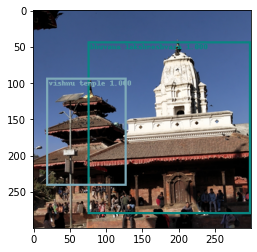

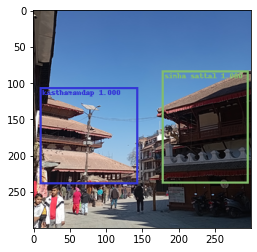

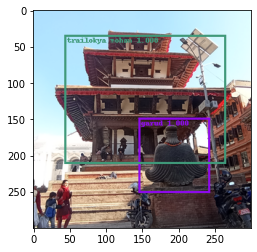

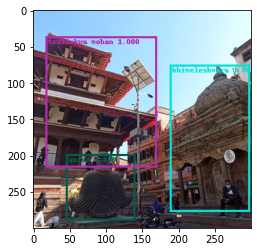

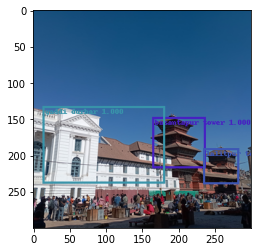

...

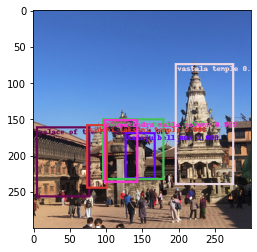

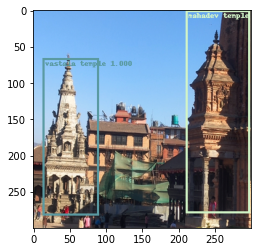

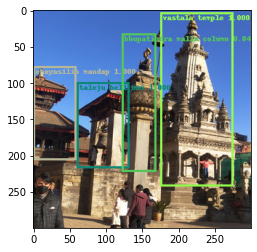

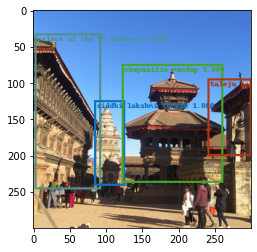

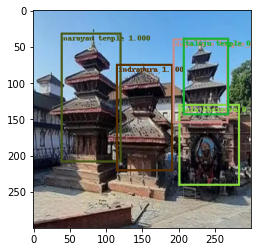

In [44]:
drawing_utils.draw_predictions(test_data, pred_bboxes, pred_labels, pred_scores, labels, batch_size)

In [ ]:
precision = list()
recall = list()
for key, value in stats.items():
    precision.extend(value['precision'])
    recall.extend(value['recall'])

In [ ]:
print(stats[5]['scores'],stats[5]['recall'], stats[5]['precision'])

In [68]:
import pandas as pd
test = {'Confidence': stats[2]['scores'], 'TP': stats[2]['tp'], 'FP': stats[2]['fp']}
df = pd.DataFrame(test)
total = stats[2]['total']

In [69]:
new_data_list = list()
accumulated_TP = 0
accumulated_FP = 0
for row in df.iterrows():
    if row[1]['TP'] == 1:
        accumulated_TP += 1
    elif row[1]['FP'] == 1:
        accumulated_FP += 1
    precision = float(accumulated_TP) / (float(accumulated_TP) + float(accumulated_FP))
    recall = float(accumulated_TP) / total
    new_data_list.append((row[1]['Confidence'], row[1]['TP'], row[1]['FP'], accumulated_TP, accumulated_FP, precision, recall))

In [72]:
column_name = ['Confidence', "TP", "FP", 'Acc TP', 'Acc FP', 'Precision', 'Recall']
new_df = pd.DataFrame(new_data_list, columns = column_name)
new_df

,Confidence,TP,FP,Acc TP,Acc FP,Precision,Recall
0,0.999991,1.0,0.0,1,0,1.000000,0.047619
1,0.831384,0.0,1.0,1,1,0.500000,0.047619
2,0.791180,0.0,1.0,1,2,0.333333,0.047619
3,0.963320,1.0,0.0,2,2,0.500000,0.095238
4,0.999027,1.0,0.0,3,2,0.600000,0.142857
5,0.999942,1.0,0.0,4,2,0.666667,0.190476
6,1.000000,1.0,0.0,5,2,0.714286,0.238095
7,0.988014,1.0,0.0,6,2,0.750000,0.285714
8,0.999606,1.0,0.0,7,2,0.777778,0.333333
9,0.999572,1.0,0.0,8,2,0.800000,0.380952


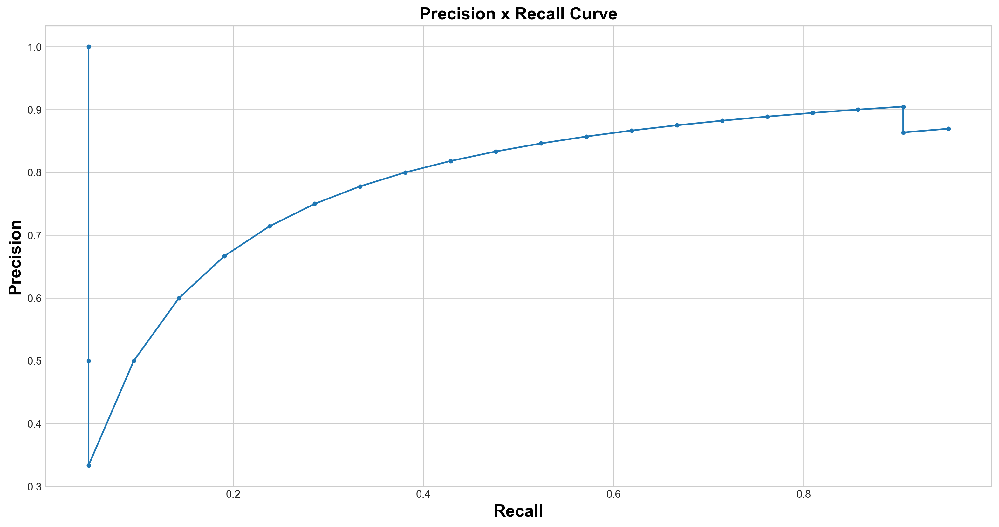

In [71]:
plt.figure(figsize = (16, 8), dpi = 240)
plt.style.use('seaborn-whitegrid')
plt.plot(new_df['Recall'], new_df['Precision'])
plt.scatter(new_df['Recall'], new_df['Precision'], s = 10)
font = {'color': 'black', 'size': 16, 'weight': 'bold'}
plt.xlabel('Recall', fontdict = font)
plt.ylabel('Precision', fontdict = font)
plt.title('Precision x Recall Curve', font)
plt.xticks()
# plt.savefig('precision_recall_curve.jpg', dpi = 480, bbox_inches = 'tight', pad_inches = 0.4)
plt.show()

In [27]:
stats[2]

{'label': 'basantapur tower',
 'total': 95,
 'tp': [1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  1,
  1,
  0,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  0,
  1,
  1,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  0,
  1,
  1,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  1,
  1,
  1],
 'fp': [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0

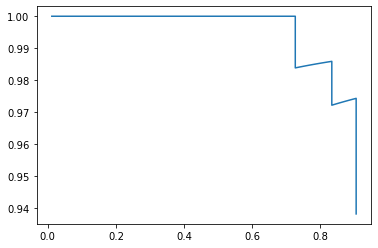

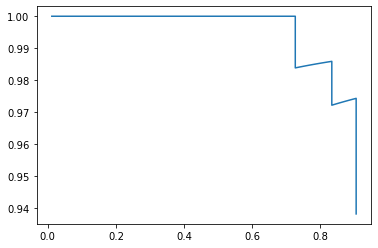

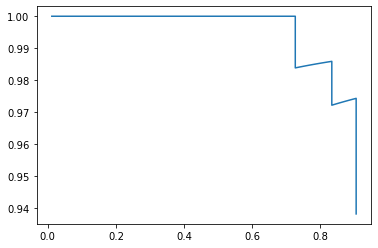

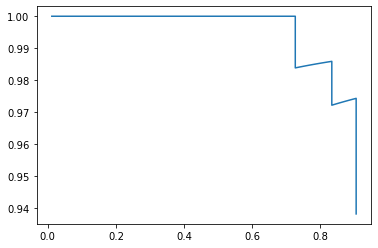

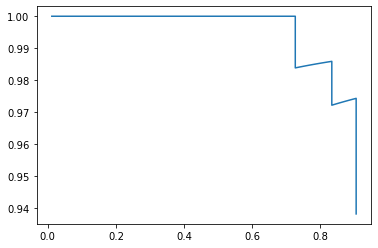

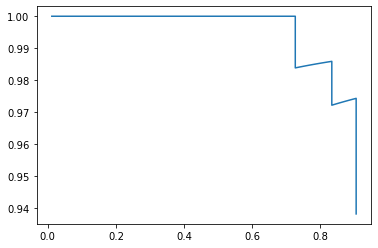

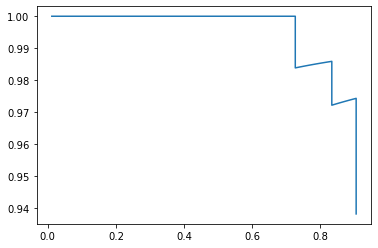

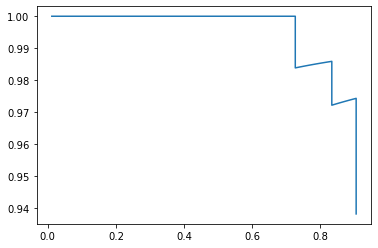

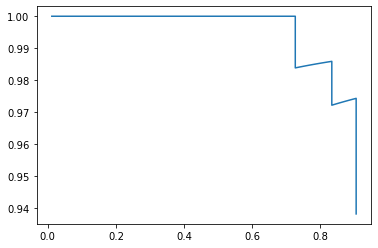

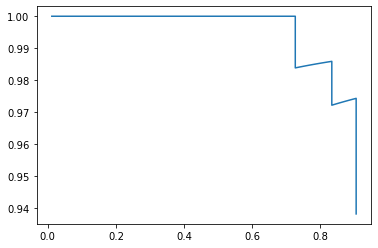

In [36]:
for i in range(10):
    plt.plot(stats[6]['recall'], stats[6]['precision'])
    plt.show()

In [45]:
filenames_list = list()
for filename in os.listdir('./test_images'):
    filenames_list.append(filename)
total_items = len(filenames_list)
img_pred_bboxes = list()
img_pred_labels = list()
img_pred_scores = list()
output_dict = {}
for i in range(total_items):
    image_path = os.path.join('test_images', filenames_list[i])
    image = Image.open(image_path)
    height, width = image.size
    count = 0
    temp_pred_bboxes = list()
    temp_pred_labels = list()
    temp_pred_scores = list()
    for bbox_list in pred_bboxes[i]:
        if bbox_list[0] > 0 or bbox_list[1] > 0:
            count += 1
            y1 = int(bbox_list[0] * height)
            x1 = int(bbox_list[1] * width)
            y2 = int(bbox_list[2] * height)
            x2 = int(bbox_list[3] * width)
            temp_pred_bboxes.append([y1, x1, y2, x2])
    for j in range(count):
        temp_pred_labels.append(labels[int(pred_labels[i][j])])
        temp_pred_scores.append(pred_scores[i][j])
    
    temp = dict()
    temp['image_path'] = image_path
    temp['bboxes'] = temp_pred_bboxes
    temp['labels'] = temp_pred_labels
    temp['scores'] = temp_pred_scores
    output_dict[filenames_list[i]] = temp
    img_pred_scores.append(temp_pred_scores)
    img_pred_labels.append(temp_pred_labels)
    img_pred_bboxes.append(temp_pred_bboxes)
# print(output_dict)

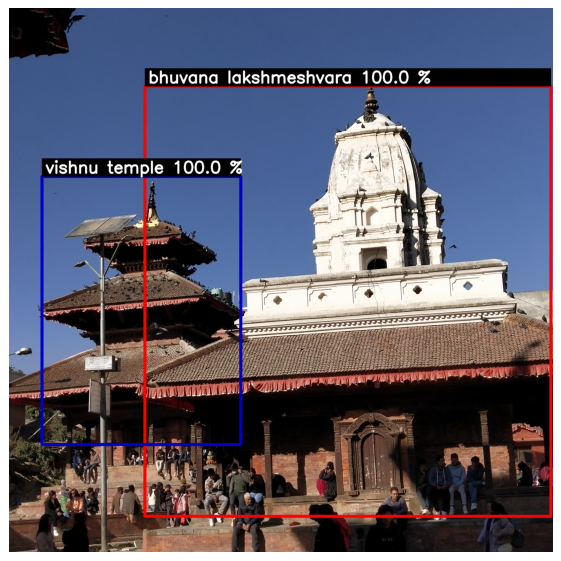

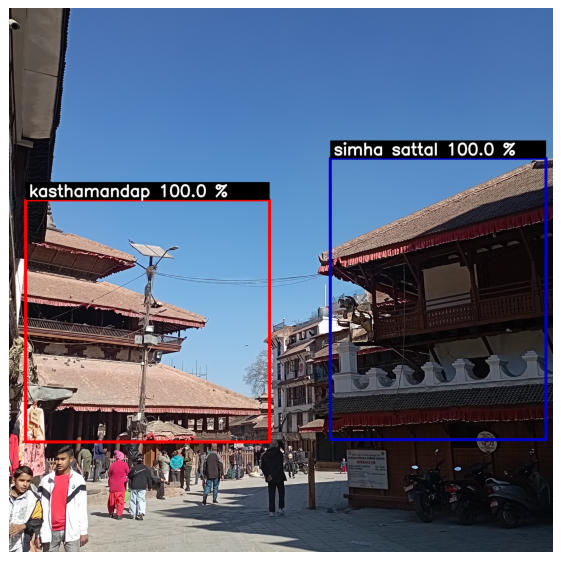

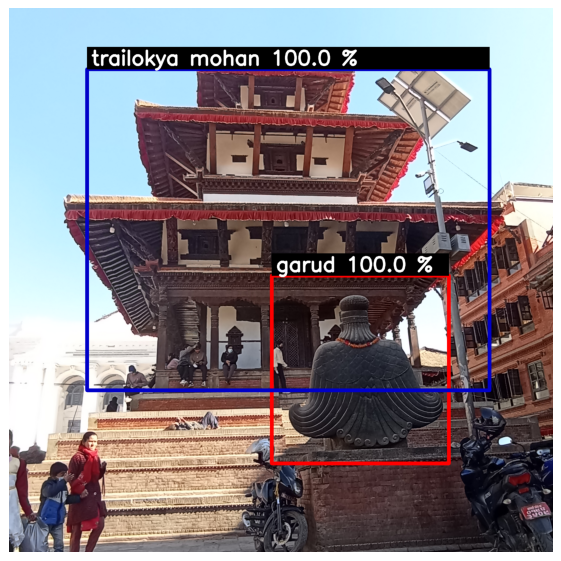

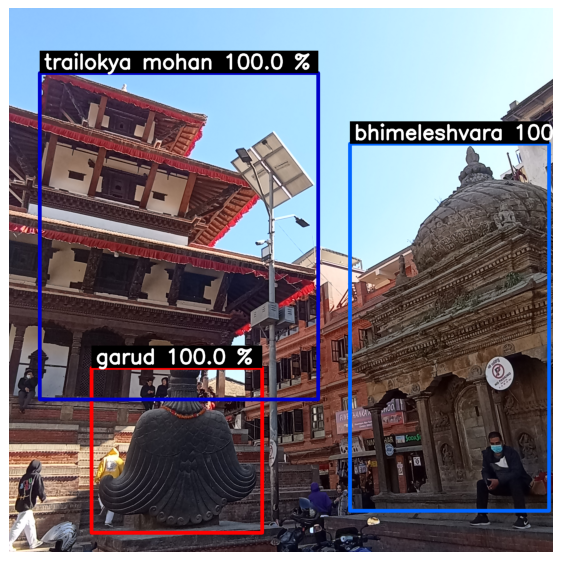

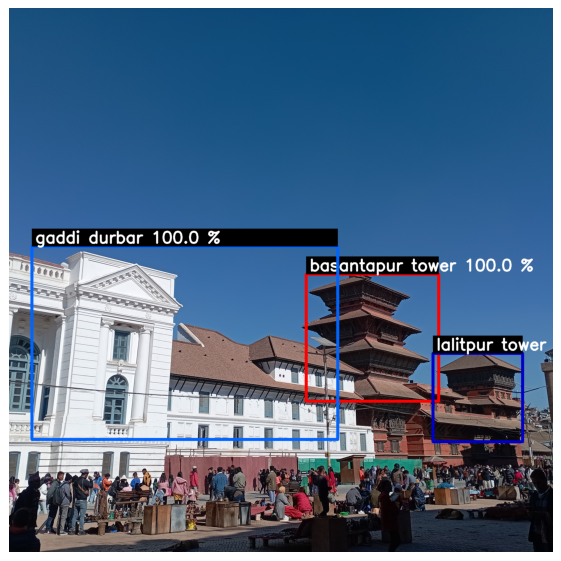

...

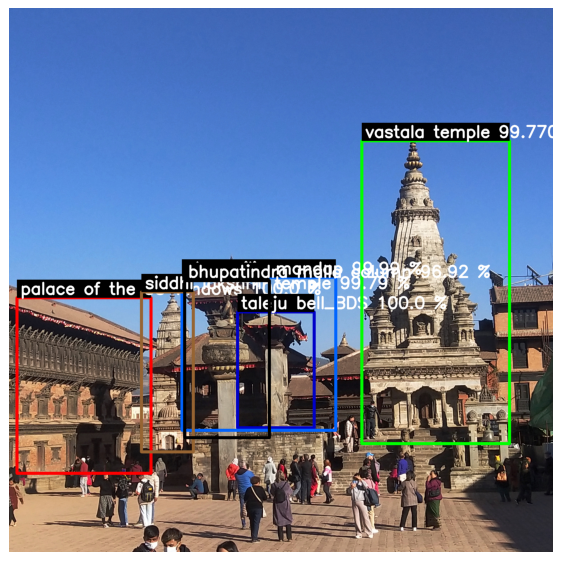

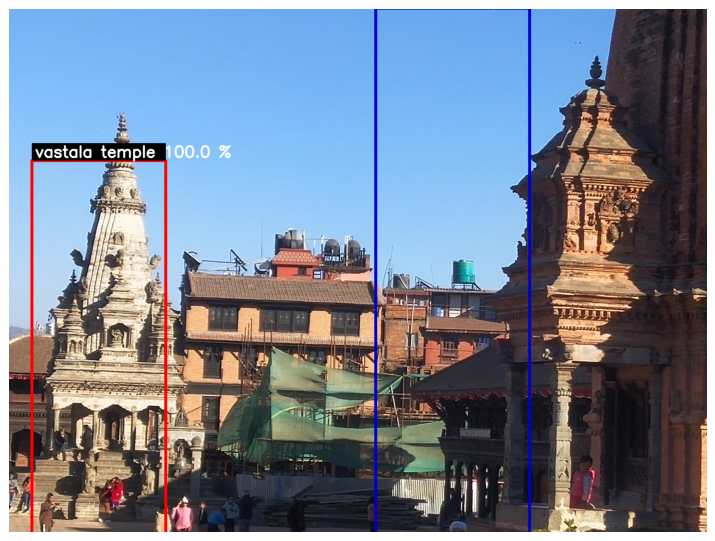

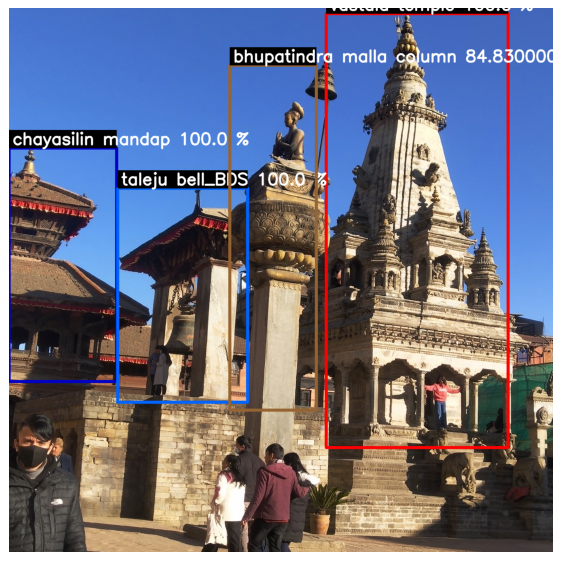

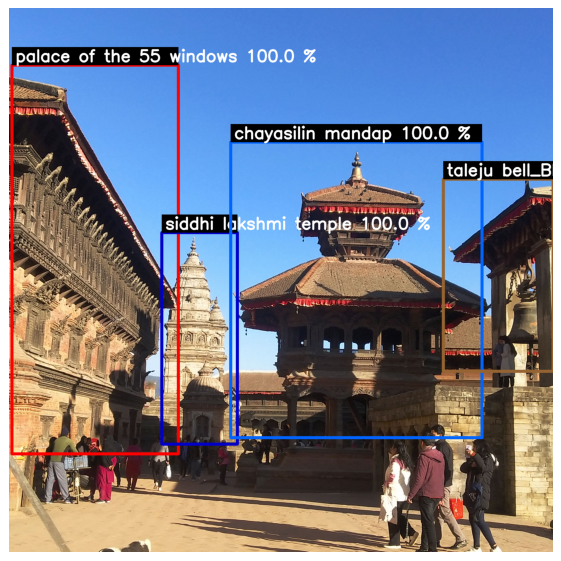

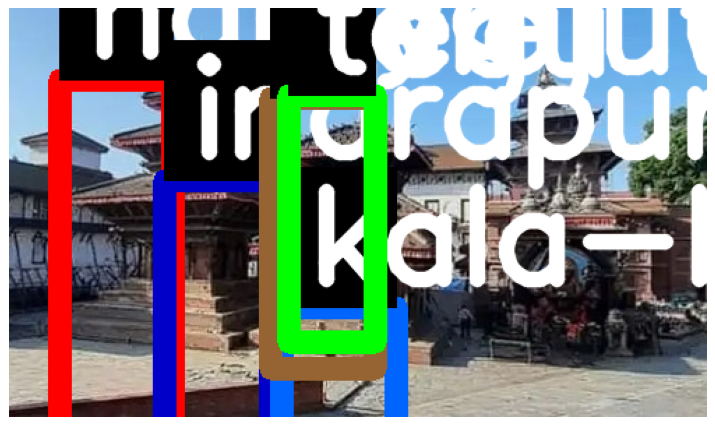

In [46]:
colors = [(0, 0, 255), (200 , 0, 0), (255, 100, 0), (50, 100, 150), (0, 255, 0), (0, 0, 0), (125, 148, 255)]
for key, value in output_dict.items():
    img = cv2.imread(value['image_path'])
    for i in range(len(value['bboxes'])):
        label = value['labels'][i]
        predicted_score = "%.4f" % value['scores'][i]
        label = label + " " + str(float(predicted_score) * 100) + " %"
        cv2.rectangle(img, (value['bboxes'][i][1], value['bboxes'][i][0]), (value['bboxes'][i][3], value['bboxes'][i][2]), color = colors[i], thickness = 15)
        cv2.rectangle(img, (value['bboxes'][i][1], value['bboxes'][i][0] - 100) , (value['bboxes'][i][3], value['bboxes'][i][0]), color = (0, 0, 0), thickness = -1 )
        cv2.putText(img, label, (value['bboxes'][i][1] + 20, value['bboxes'][i][0] - 20), cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 255,  255), 10, cv2.LINE_AA)
    plt.figure(figsize = (10, 8), dpi = 90)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.savefig('./test_images/new_'+ key, dpi = 240)
    plt.show()

In [37]:
label = labels[int(pred_labels[0][0])]
predicted_score = "%.4f" % pred_scores[0][0]
label = label + " " + str(float(predicted_score) * 100) + " %"

In [38]:
img = cv2.imread('test_images\IMG20230122143048.jpg')
cv2.rectangle(img, (x1, y1 + 10), (x2, y2), color = (0, 0, 255), thickness = 15)
cv2.putText(img, label, (x1, y1), cv2.FONT_HERSHEY_SIMPLEX, 4, (0, 0, 0), 15, cv2.LINE_AA)
# cv2.imwrite("bounding.jpg", img)

array([[[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [102, 108, 103],
        [105, 110, 108],
        [103, 108, 106]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [102, 108, 103],
        [107, 110, 108],
        [105, 108, 106]],

       [[  0,   0, 255],
        [  0,   0, 255],
        [  0,   0, 255],
        ...,
        [103, 107, 102],
        [108, 106, 105],
        [109, 105, 104]],

       ...,

       [[ 30,  68,  46],
        [ 37,  64,  44],
        [ 56,  61,  46],
        ...,
        [ 34,  24,  17],
        [ 29,  23,  18],
        [ 24,  21,  16]],

       [[  9, 144,  76],
        [ 31, 133,  75],
        [ 33,  66,  32],
        ...,
        [ 38,  23,  20],
        [ 34,  23,  19],
        [ 28,  19,  15]],

       [[  0, 158,  66],
        [  7, 147,  70],
        [ 24,  70,  27],
        ...,
        [ 45,  30,  28],
        [ 40,  25,  22],
        [ 30,  18,  14]]

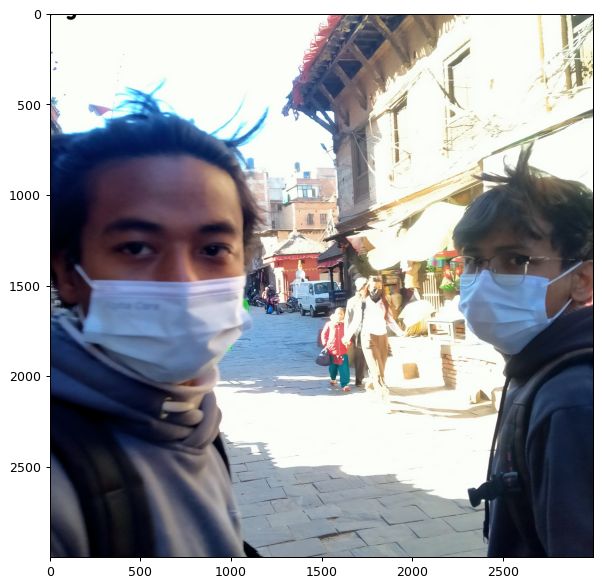

In [39]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10, 8), dpi = 90)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
# plt.axis('off')
plt.show()